<a href="https://colab.research.google.com/github/sakshi79/Coursera-GANs/blob/main/Build%20basic%20GANs/First_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
#torch.manual_seed(0)

In [2]:
def show_tensor_images(image_tensor, num_images=25, size=(1,28,28)):
  image_unflat = image_tensor.detach().cpu().view(-1, *size)
  image_grid = make_grid(image_unflat[:num_images], nrow=5)
  plt.imshow(image_grid.permute(1,2,0).squeeze())
  plt.show()

In [3]:
def get_generator_block(input_dim, output_dim):
  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.BatchNorm1d(output_dim),
      nn.ReLU(inplace=True)
  )

In [4]:
class Generator(nn.Module):
  def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
    super(Generator, self).__init__()
    self.gen = nn.Sequential(
        get_generator_block(z_dim, hidden_dim),
        get_generator_block(hidden_dim, hidden_dim*2),
        get_generator_block(hidden_dim*2, hidden_dim*4),
        get_generator_block(hidden_dim*4, hidden_dim*8),
        nn.Linear(hidden_dim*8, im_dim),
        nn.Sigmoid()
    )

  def forward(self, noise):
      return self.gen(noise)

  def get_gen(self):
      return self.gen

In [5]:
def get_noise(n_samples, z_dim, device='cpu'):
  return torch.randn(n_samples, z_dim, device=device)

In [6]:
def get_discriminator_block(input_dim, output_dim):
  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.LeakyReLU(0.2)
  )

In [7]:
class Discriminator(nn.Module):
  def __init__(self, im_dim=784, hidden_dim=128):
    super(Discriminator, self).__init__()
    self.disc = nn.Sequential(
        get_discriminator_block(im_dim, hidden_dim*4),
        get_discriminator_block(hidden_dim*4, hidden_dim*2),
        get_discriminator_block(hidden_dim*2, hidden_dim),
        nn.Linear(hidden_dim, 1)
    )

  def forward(self, image):
      return self.disc(image)

  def get_disc(self):
      return self.disc

### Set Parameters

In [8]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'

### Load MNIST dataset as tensors

In [9]:
dataloader = DataLoader(
    MNIST('.', download = True, transform=transforms.ToTensor()),
    batch_size = batch_size,
    shuffle = True
)

### Initialize generators, discriminators, and optimizers

In [10]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

### Defining loss functions with discriminator's output as 0 for fake image and 1 for a real image

In [11]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
  '''
    Evaluating Discriminator's loss
  '''
  noise = get_noise(num_images, z_dim, device=device)
  fake = gen(noise).detach()
  pred_fake = disc(fake)  # Discriminator's prediction on fake images
  loss_fake = criterion(pred_fake, torch.zeros_like(pred_fake))
  pred_real = disc(real)

  loss_real = criterion(pred_real, torch.ones_like(pred_real))
  disc_loss = (loss_real + loss_fake) / 2

  return disc_loss


In [12]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
  '''
    Evaluating Generator's loss
  '''
  noise = get_noise(num_images, z_dim, device=device)
  fake = gen(noise)
  pred_fake = disc(fake)
  gen_loss = criterion(pred_fake, torch.ones_like(pred_fake))  # Calculating loss by comparing discriminator's output with generator's assumption that its generating real images.
  return gen_loss


### Putting it together

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.4963817650079734, discriminator loss: 0.4075301346182818


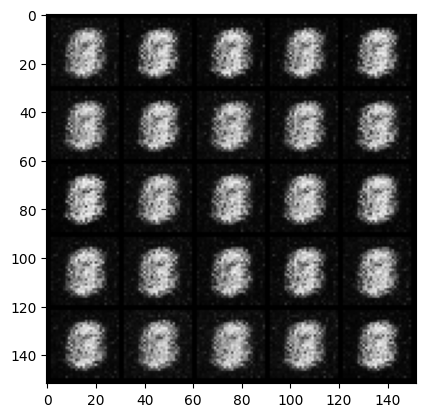

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 1.8118700423240652, discriminator loss: 0.27314747026562697


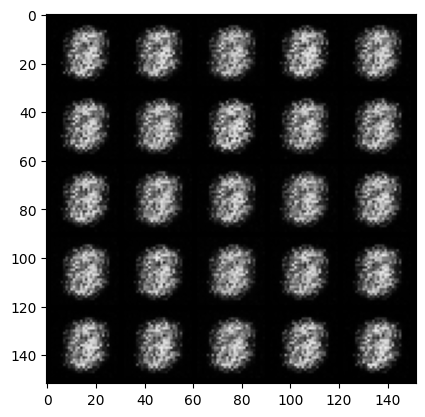

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 2.181529721260071, discriminator loss: 0.1465886624008416


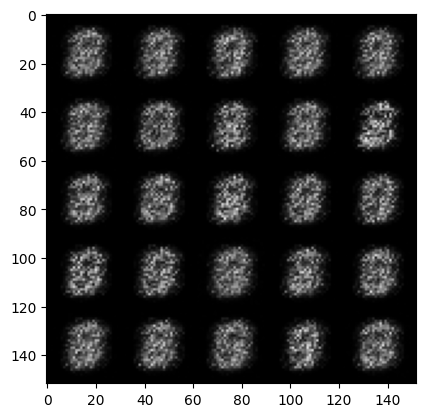

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 1.8220006339550021, discriminator loss: 0.20777567139267908


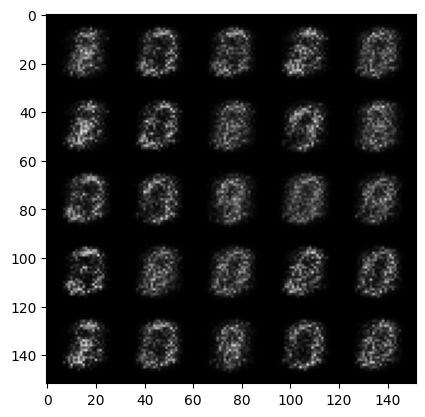

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 1.659205490350724, discriminator loss: 0.2254865728318692


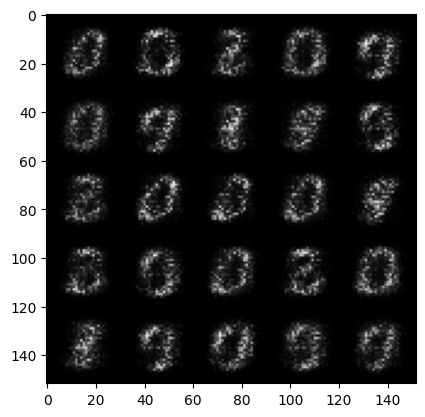

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 1.847994585990906, discriminator loss: 0.18002454745769514


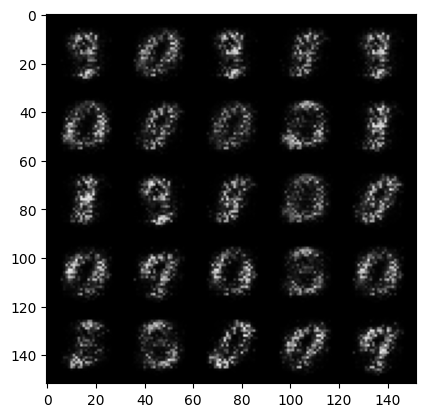

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 2.2766374781131757, discriminator loss: 0.12804288730025287


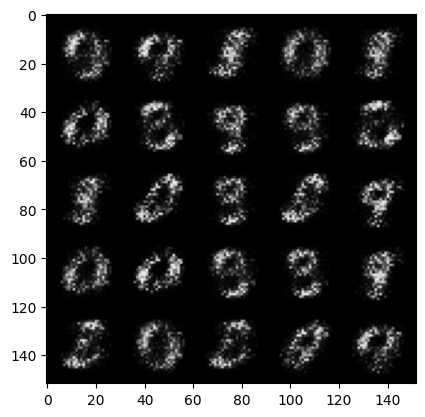

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 2.699721551418302, discriminator loss: 0.10475220692157748


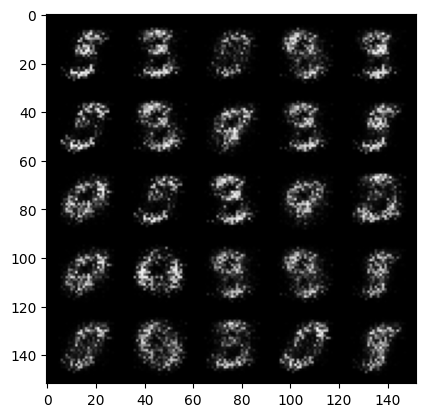

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 3.1184491186142, discriminator loss: 0.09141183662414555


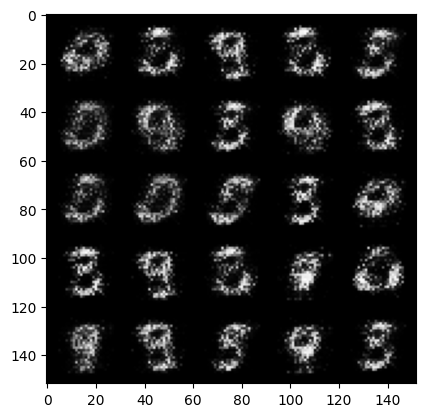

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 3.3624335961341827, discriminator loss: 0.07308379276096823


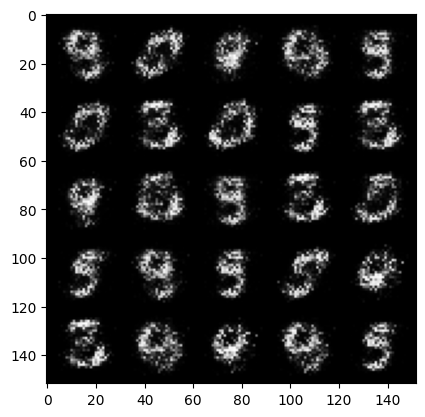

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 3.7287692813873305, discriminator loss: 0.06426872126758103


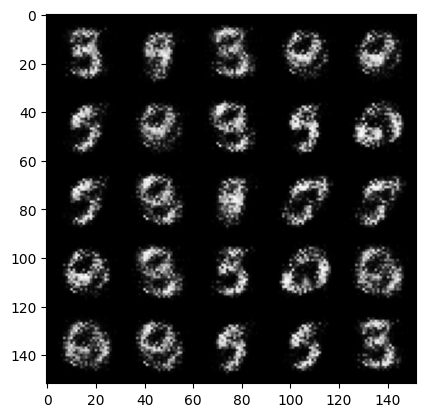

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 3.7530655298233015, discriminator loss: 0.07086459742486473


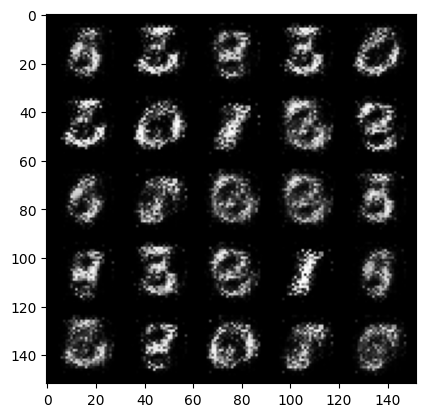

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 3.7822073545455908, discriminator loss: 0.06850518537685268


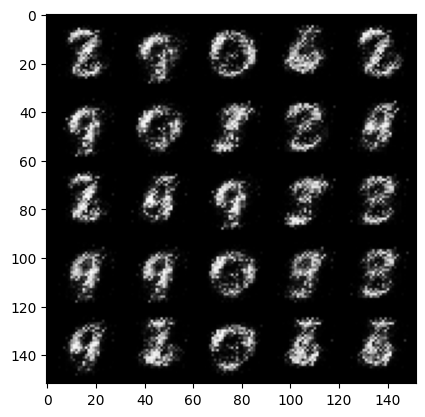

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 4.107559650421144, discriminator loss: 0.055866596445441265


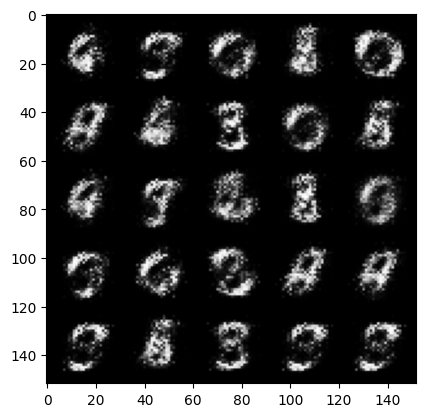

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 4.159594517707821, discriminator loss: 0.04275281816720968


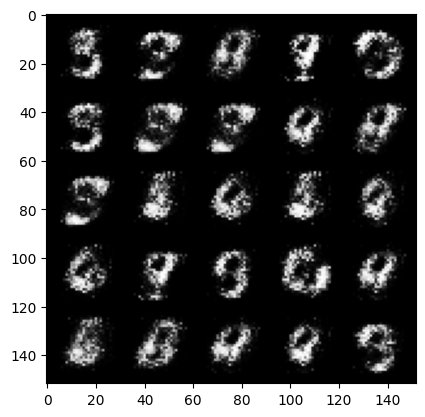

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 4.364076706409452, discriminator loss: 0.04739671402424573


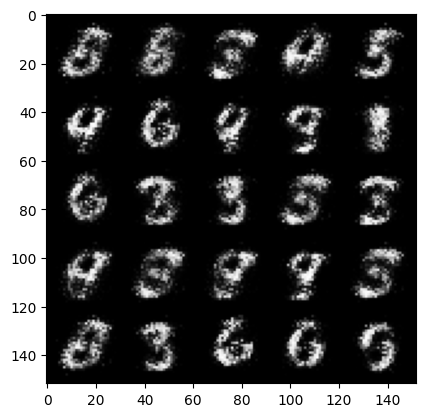

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 4.281033659935001, discriminator loss: 0.04648469528928403


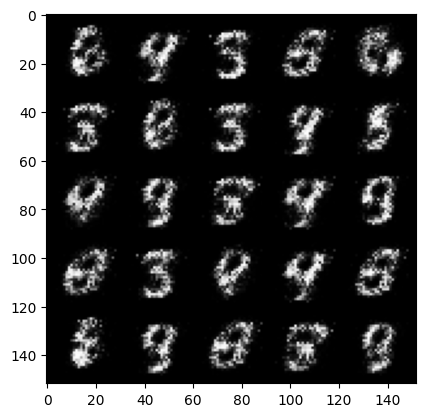

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 4.312734028816222, discriminator loss: 0.05355216892063617


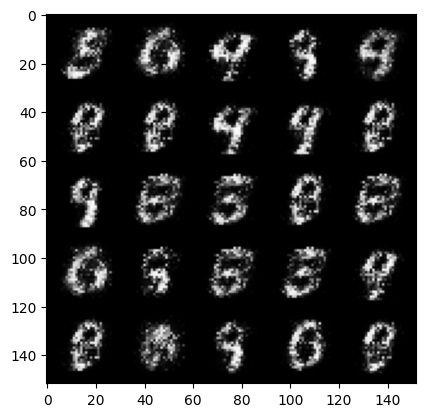

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 4.303430543899537, discriminator loss: 0.054343991309404385


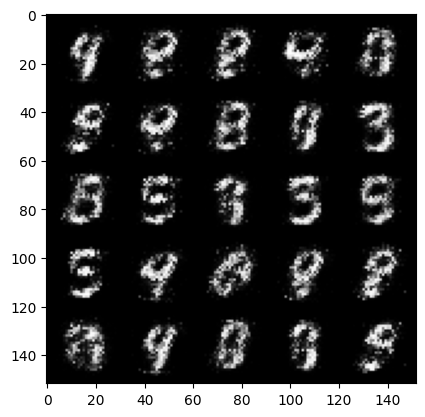

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 4.180646575927735, discriminator loss: 0.06294631060212855


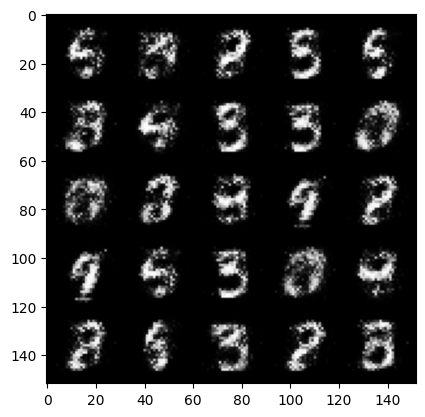

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 4.015707868099214, discriminator loss: 0.05665348940715194


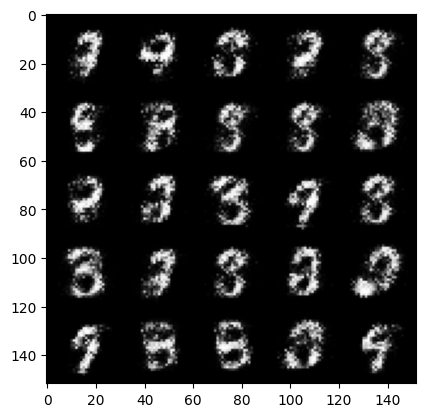

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 4.033214926242828, discriminator loss: 0.05889603952318431


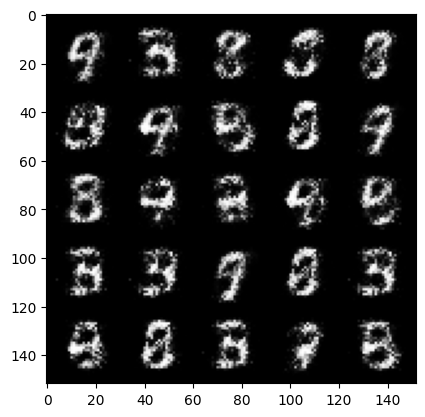

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 4.0842436022758495, discriminator loss: 0.06296304914355279


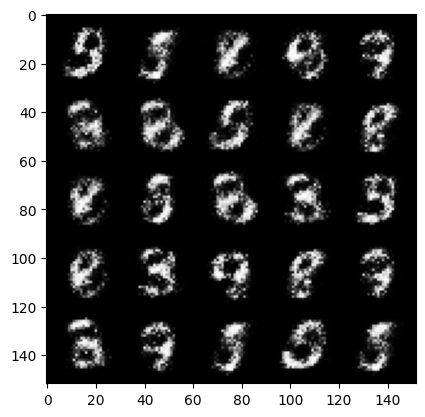

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 4.126929286479949, discriminator loss: 0.06977061053738001


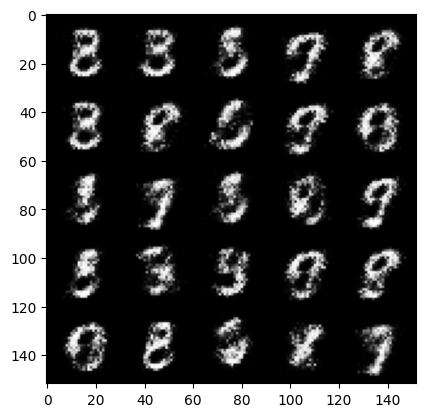

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 4.359886609554289, discriminator loss: 0.0790036638975143


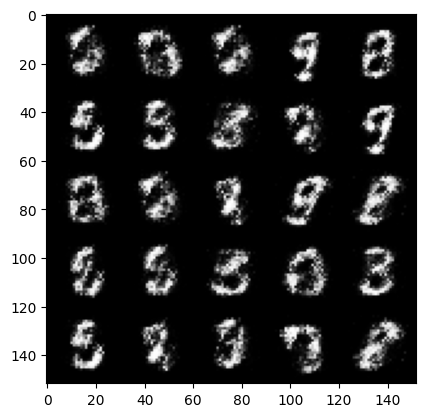

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 4.003649328231811, discriminator loss: 0.08795729464292516


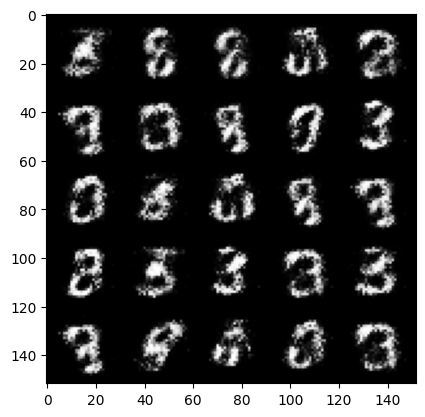

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 4.1025382971763635, discriminator loss: 0.09167451867461206


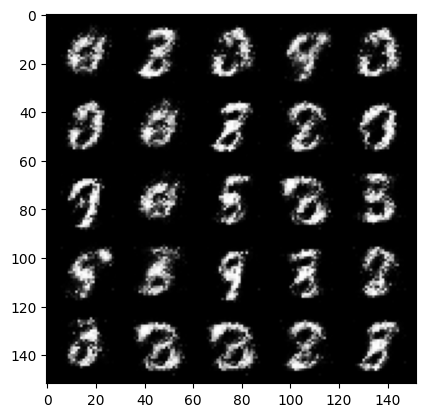

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 4.030369441986082, discriminator loss: 0.08801457278430448


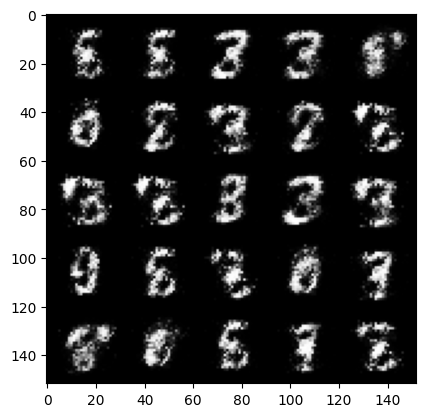

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 3.830723630905151, discriminator loss: 0.09063951757550247


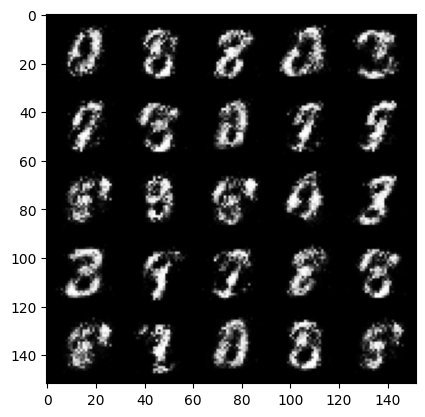

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 3.746241928100589, discriminator loss: 0.09759948901087047


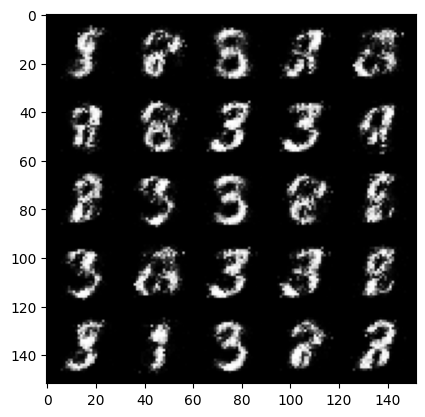

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 3.780136545658114, discriminator loss: 0.11098822256922712


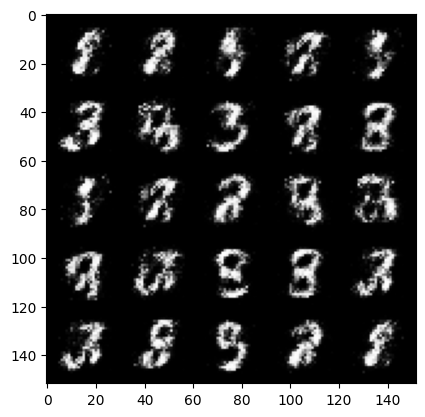

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.801510951519012, discriminator loss: 0.09997696460038441


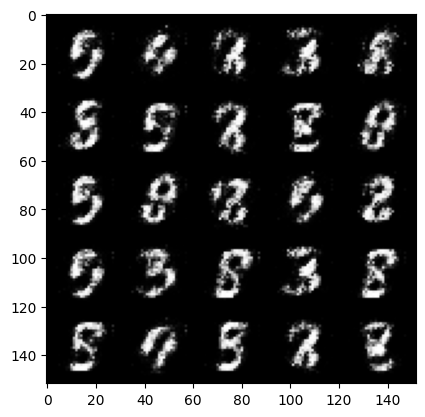

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.6371751375198387, discriminator loss: 0.11207638116925951


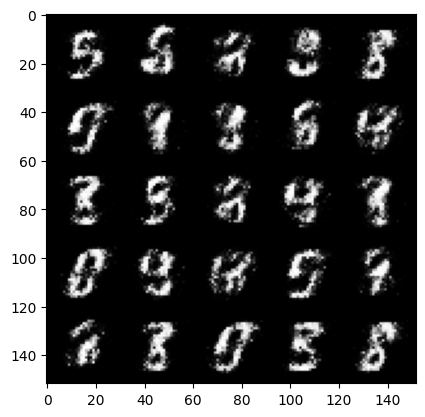

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 3.6167184591293324, discriminator loss: 0.1200643783956766


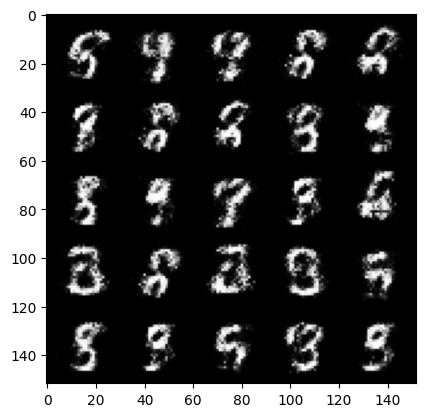

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 3.648530423641207, discriminator loss: 0.11829449550807473


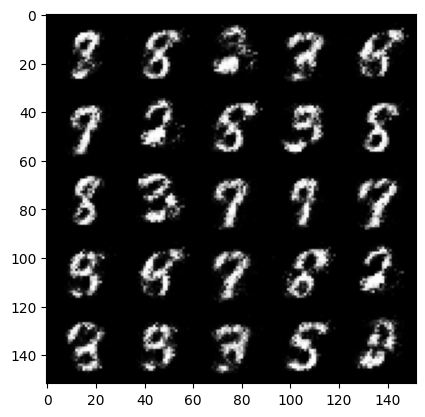

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 3.5935394387245174, discriminator loss: 0.1100824169367552


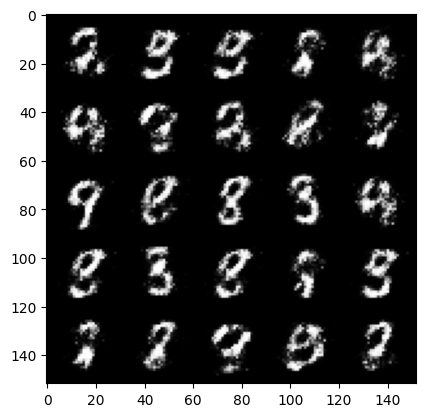

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 3.466718410015106, discriminator loss: 0.12069740846008059


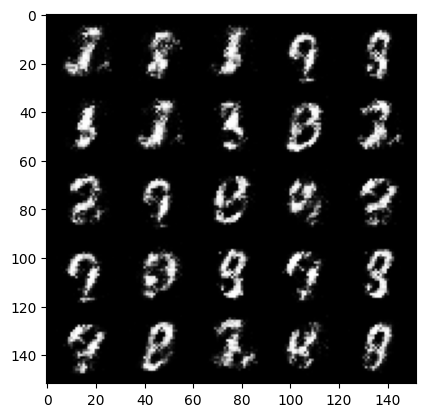

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 3.440476523876189, discriminator loss: 0.13837429951131336


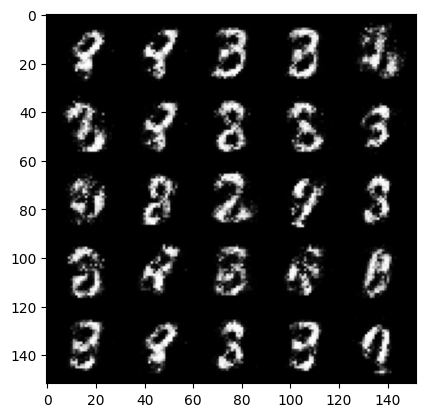

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 3.528920665740966, discriminator loss: 0.12914916319400077


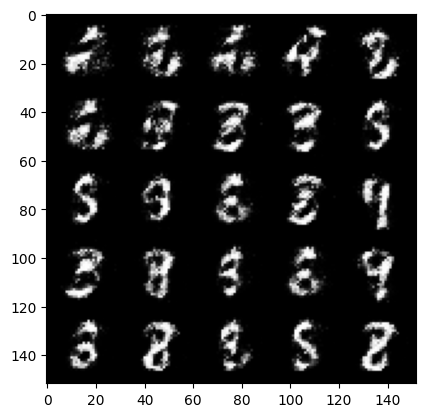

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 3.6347356815338143, discriminator loss: 0.13883054521679877


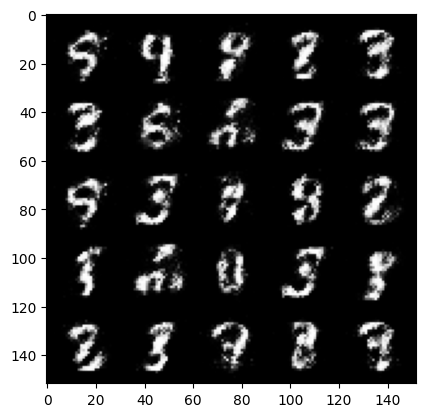

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 3.34872744512558, discriminator loss: 0.15701594011485573


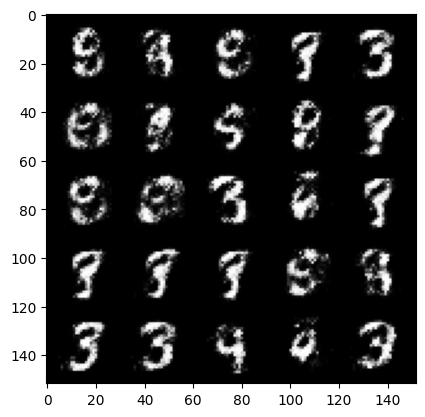

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 3.298363746643067, discriminator loss: 0.15952820444107052


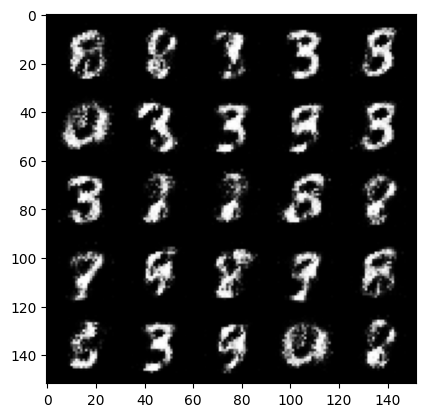

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 3.412502367019656, discriminator loss: 0.14144842943549157


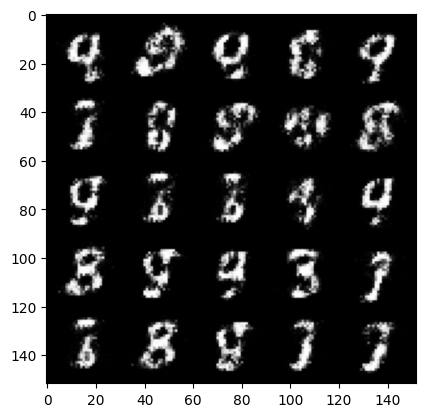

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 3.4285818362236054, discriminator loss: 0.15062774753570568


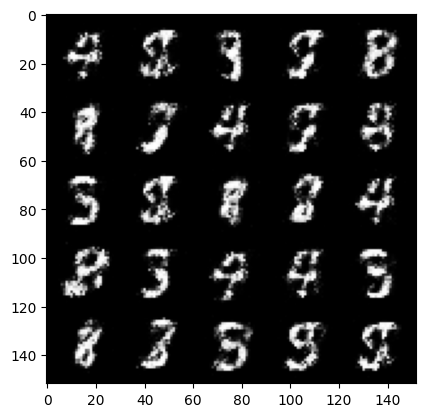

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 3.1971793227195757, discriminator loss: 0.17998936957120895


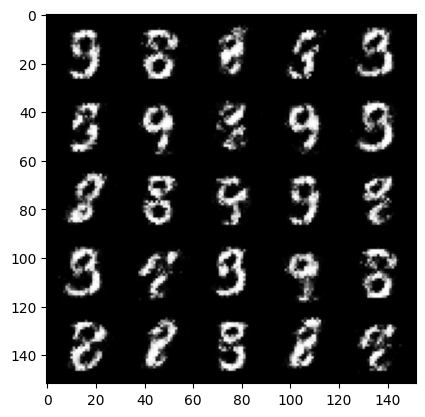

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 3.0618150715827945, discriminator loss: 0.1852559130042791


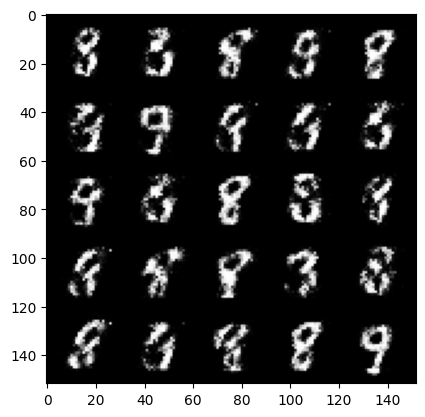

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 3.1842813773155187, discriminator loss: 0.16362721990048898


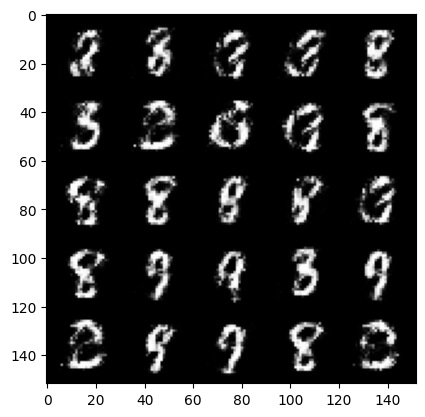

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 3.138941207408906, discriminator loss: 0.17981988216936576


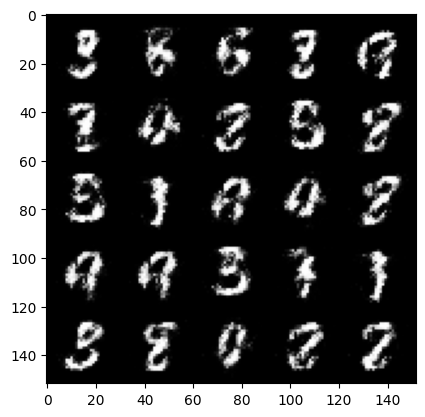

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 2.9884301962852478, discriminator loss: 0.18283674837648864


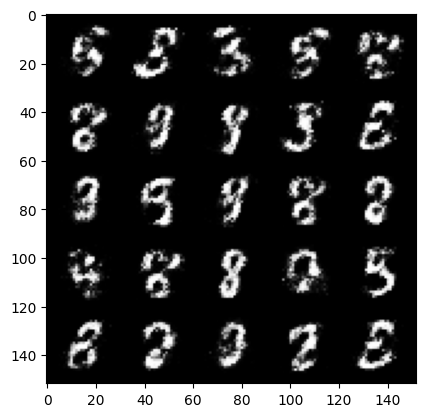

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 2.906741127967837, discriminator loss: 0.18442615355551234


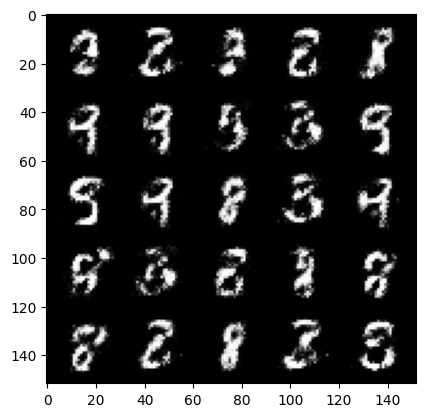

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 2.9106233701705957, discriminator loss: 0.19412099458277246


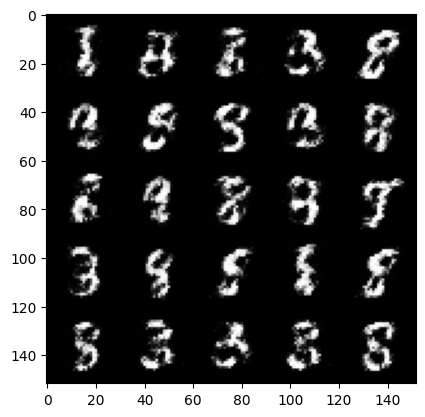

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 2.824303168296816, discriminator loss: 0.19696290193498134


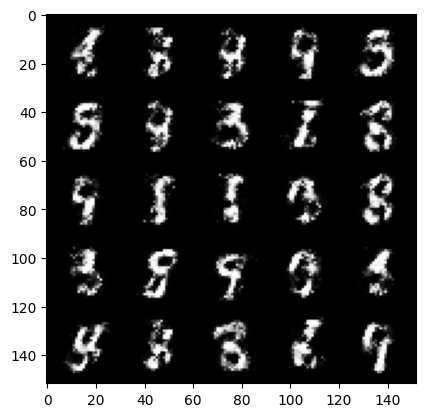

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 2.8731004328727727, discriminator loss: 0.1927480199038984


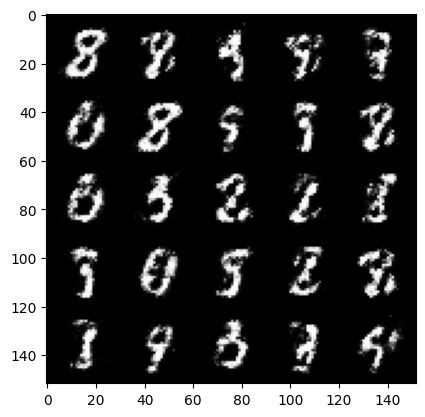

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 2.7753703613281266, discriminator loss: 0.20522320537269115


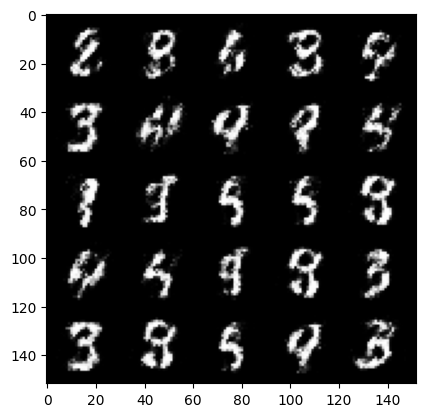

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 2.751327292442323, discriminator loss: 0.21430673605203615


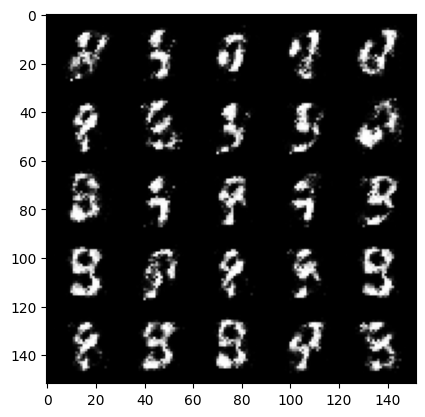

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 2.735508241653445, discriminator loss: 0.21824089607596403


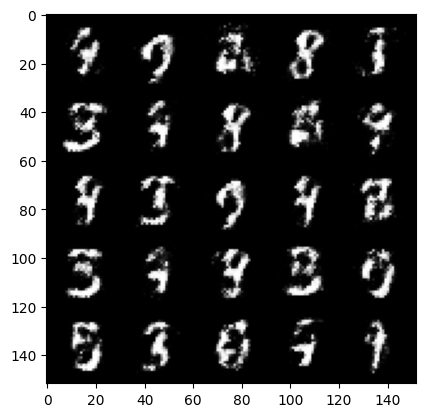

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 2.7743090209960966, discriminator loss: 0.2101860336363317


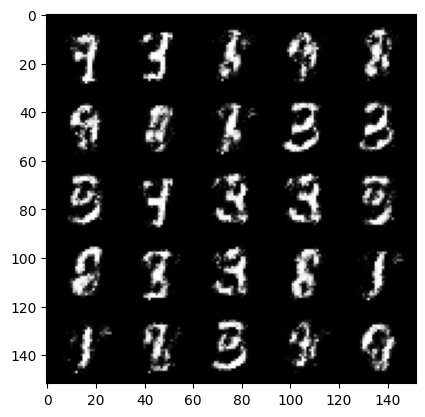

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 2.7887102837562567, discriminator loss: 0.21950243744254092


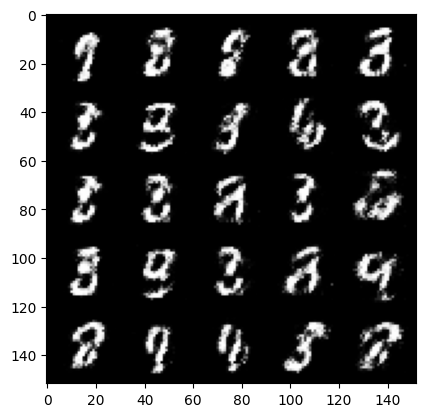

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 2.7761050186157235, discriminator loss: 0.21258850193023712


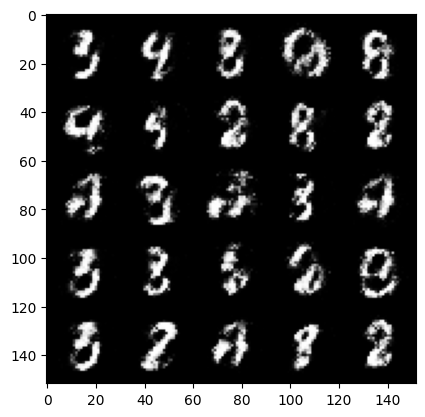

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 2.716184538364413, discriminator loss: 0.2327760779559612


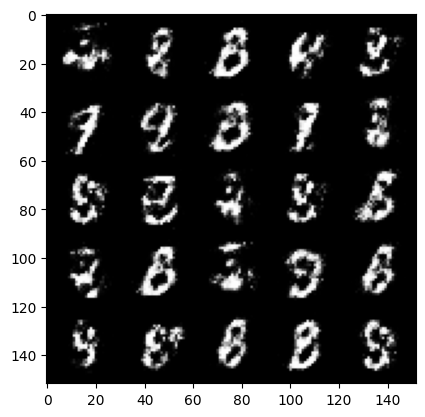

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 2.661539376258853, discriminator loss: 0.2261684070527553


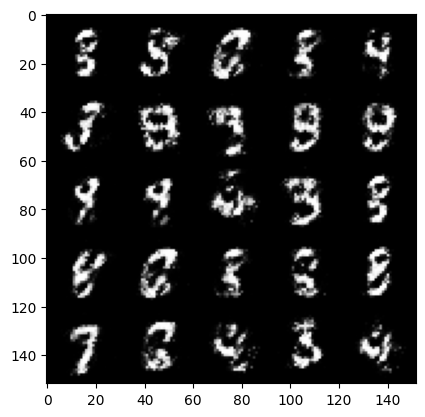

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 2.6272391862869267, discriminator loss: 0.22731558880209932


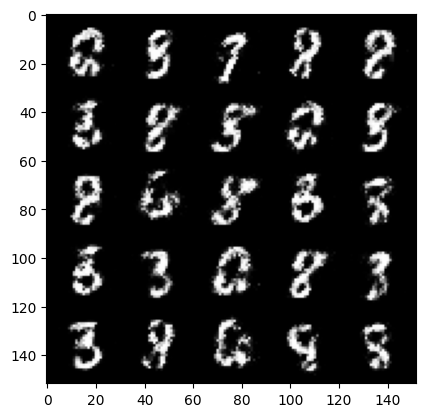

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 2.6398231153488165, discriminator loss: 0.23636682051420216


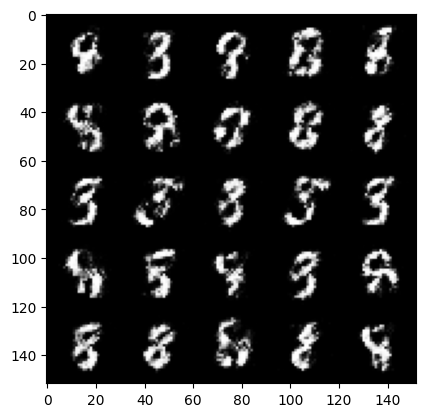

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 2.620581511974336, discriminator loss: 0.2328740126490591


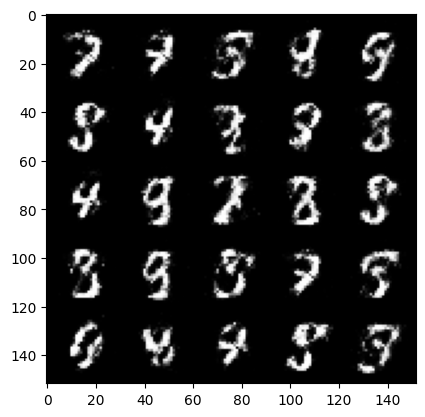

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 2.5803648204803444, discriminator loss: 0.23844451445341105


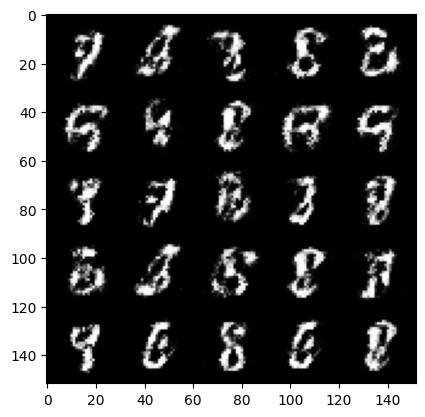

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 2.5895590686798107, discriminator loss: 0.2372330914139748


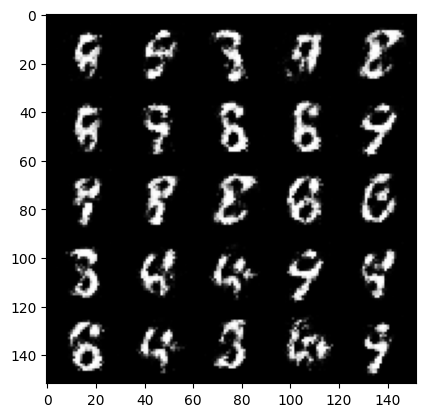

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 2.5263026695251454, discriminator loss: 0.2382531442940235


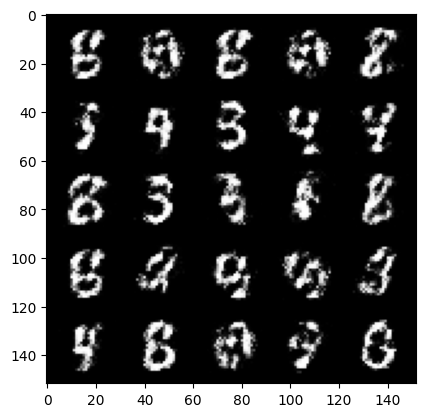

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 2.671227574348453, discriminator loss: 0.2230864315032957


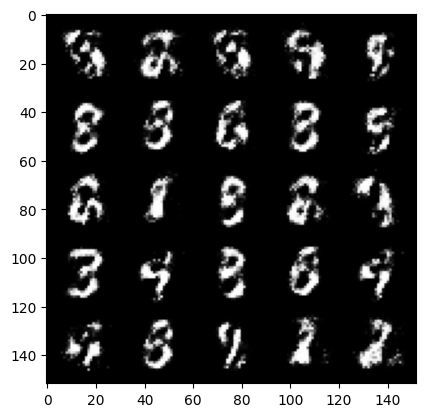

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 2.4616716065406794, discriminator loss: 0.26156794649362564


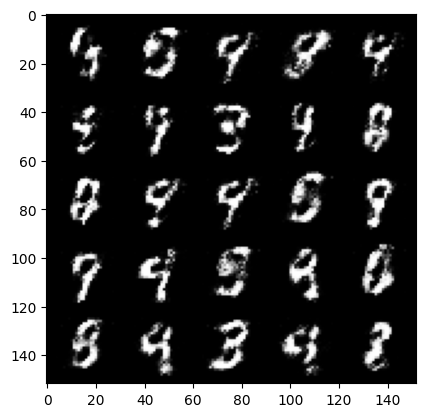

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 2.4272137484550482, discriminator loss: 0.2516905474066736


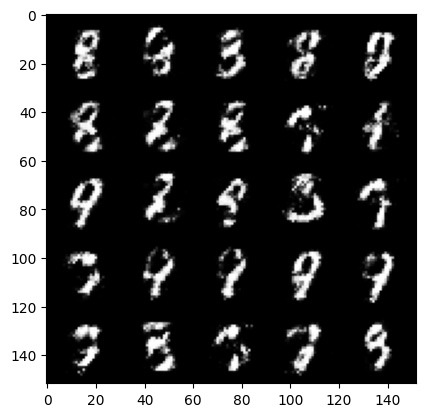

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 2.4916153120994564, discriminator loss: 0.24317423328757268


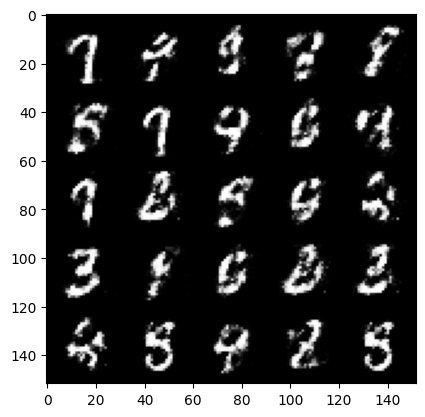

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 2.4790024046897865, discriminator loss: 0.25689810052514067


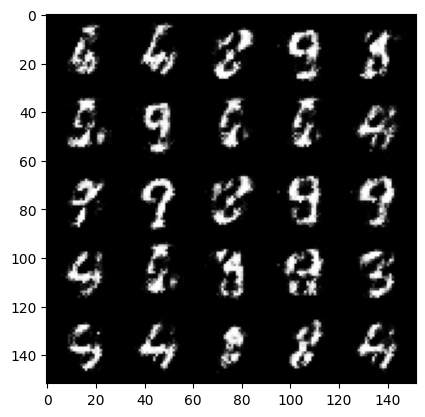

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 2.4026667373180417, discriminator loss: 0.2538388458788395


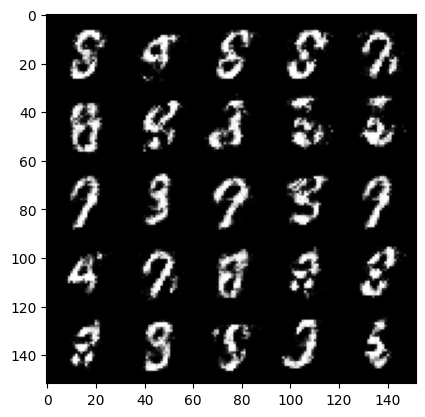

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 2.5037427124977123, discriminator loss: 0.24267095553874973


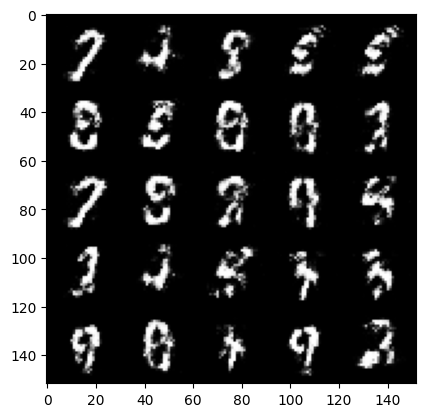

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 2.3626451845169107, discriminator loss: 0.2665180258750917


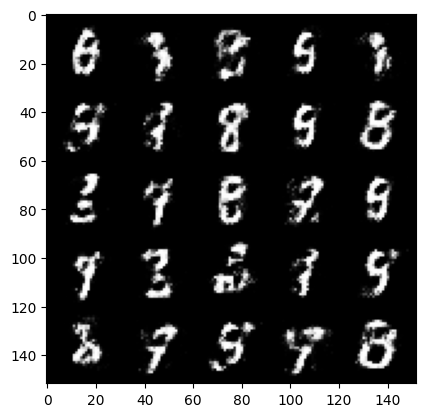

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 2.27996934556961, discriminator loss: 0.2793959099352362


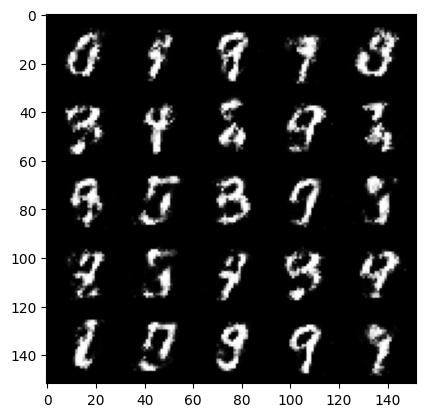

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 2.213532675743103, discriminator loss: 0.2945398170948031


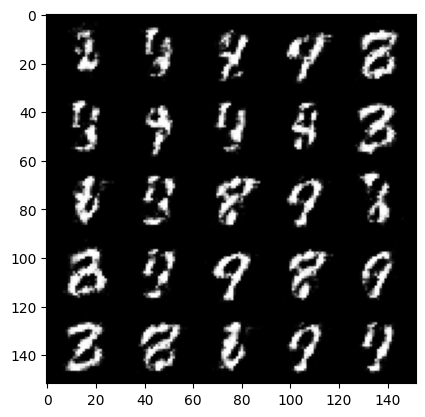

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 2.32191642665863, discriminator loss: 0.2670135647654534


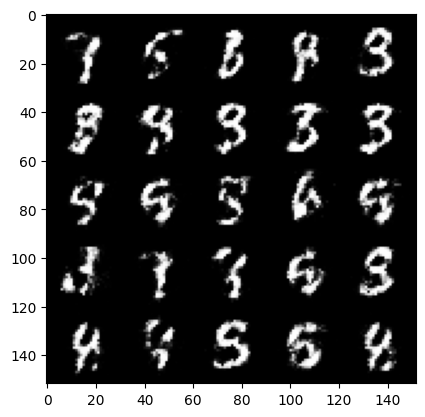

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 2.299900061607358, discriminator loss: 0.27035884833335877


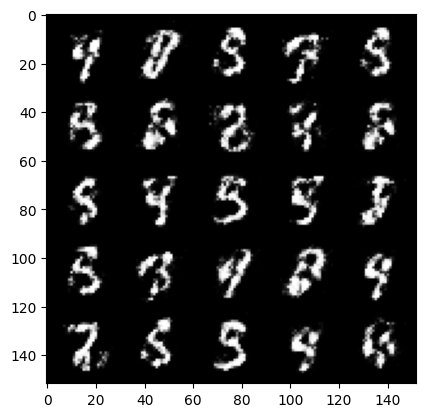

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 2.3188448686599736, discriminator loss: 0.2659917978942397


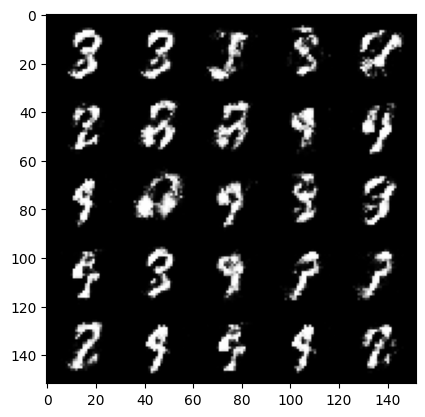

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 2.323506185054777, discriminator loss: 0.2711006703972815


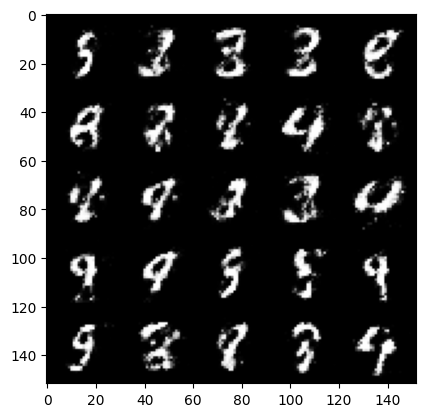

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 2.1865740356445316, discriminator loss: 0.3066123985648155


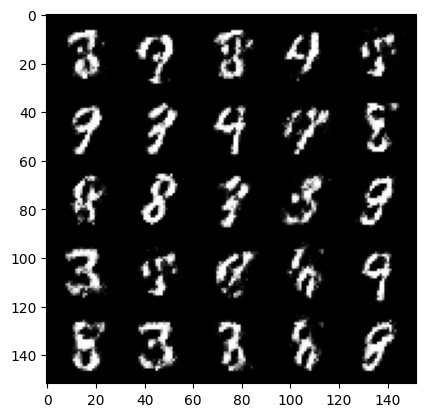

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 2.0648178863525404, discriminator loss: 0.3216346470415592


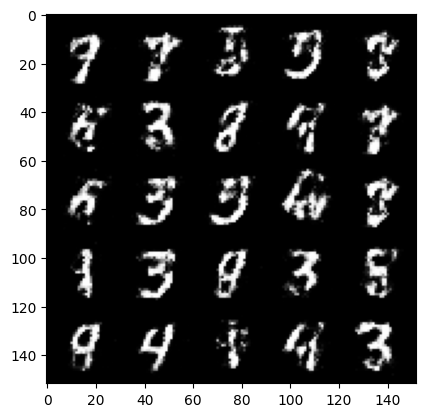

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 2.0817728028297395, discriminator loss: 0.31838095015287377


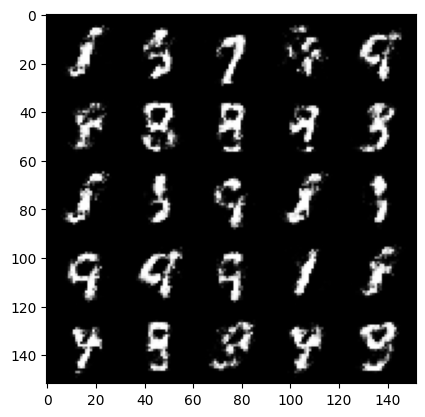

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 2.1443271718025203, discriminator loss: 0.29999567136168487


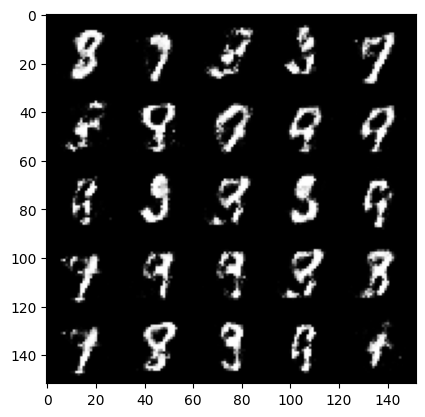

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 2.0285753679275507, discriminator loss: 0.33223897874355285


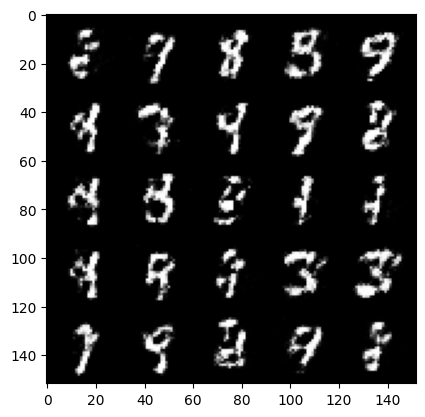

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 2.0537213242053984, discriminator loss: 0.30962315240502375


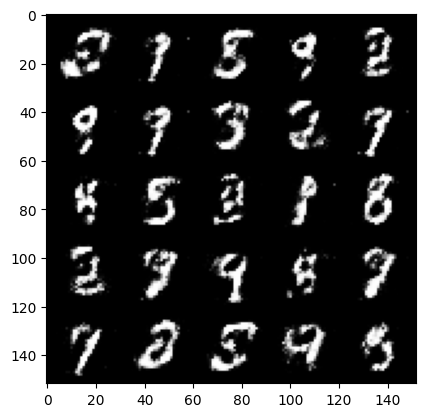

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 2.0280182950496655, discriminator loss: 0.3189201392829419


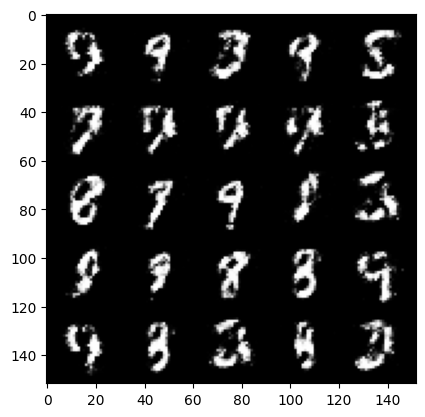

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 2.033494639158247, discriminator loss: 0.3216456105113028


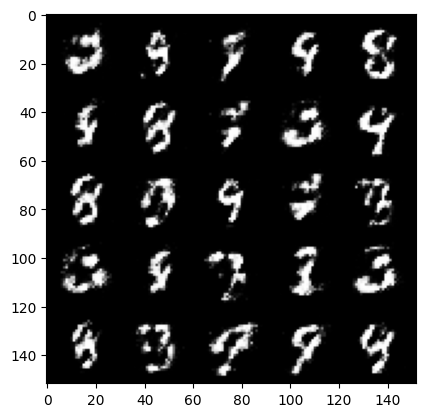

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 2.0246942169666284, discriminator loss: 0.3278483868539332


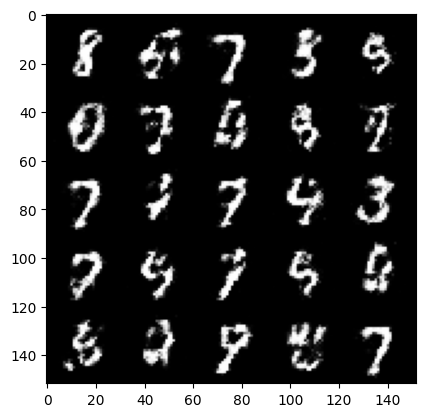

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 1.9784288828372971, discriminator loss: 0.33586290240287797


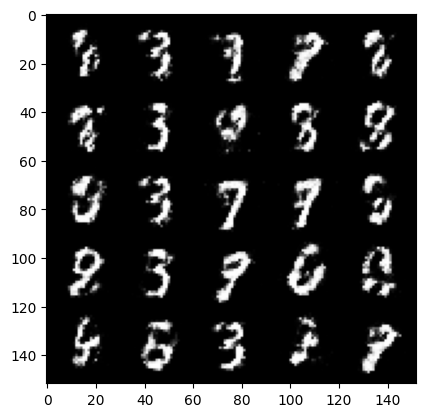

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 1.9607208678722385, discriminator loss: 0.32887812876701383


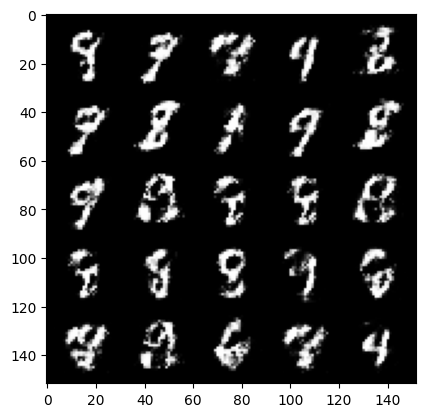

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 1.964648006916045, discriminator loss: 0.32883085650205607


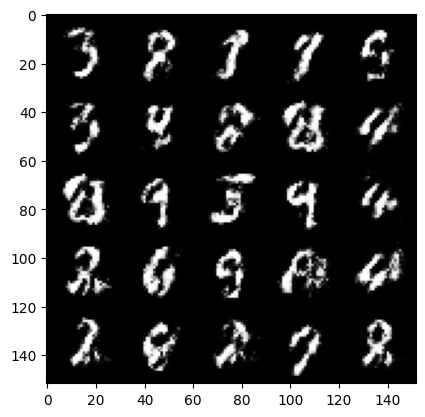

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 1.9247074451446535, discriminator loss: 0.333086254686117


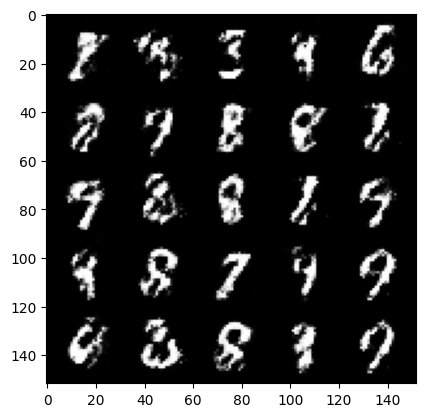

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 1.964799133539199, discriminator loss: 0.3354911933541302


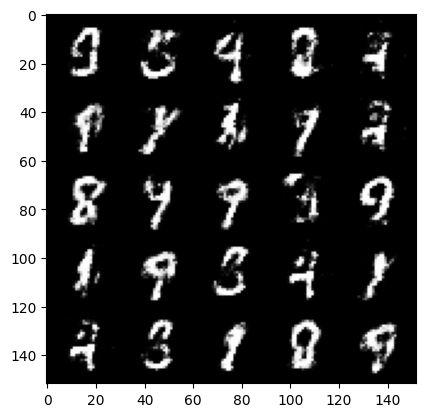

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 1.9198995947837831, discriminator loss: 0.3420502648353581


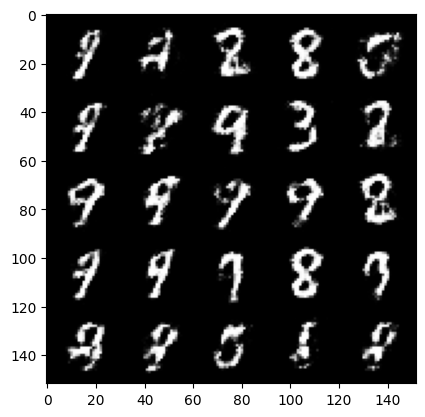

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 1.9784421460628485, discriminator loss: 0.31899226573109635


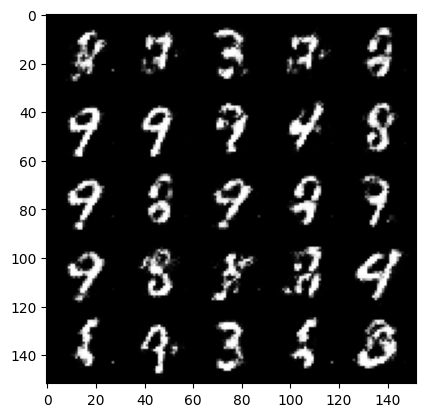

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 1.8860542519092567, discriminator loss: 0.35114706900715803


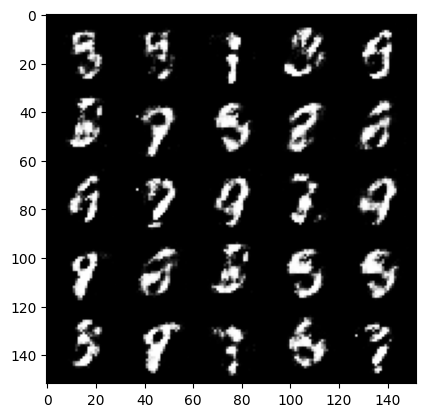

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 1.853444271802902, discriminator loss: 0.3475515838265418


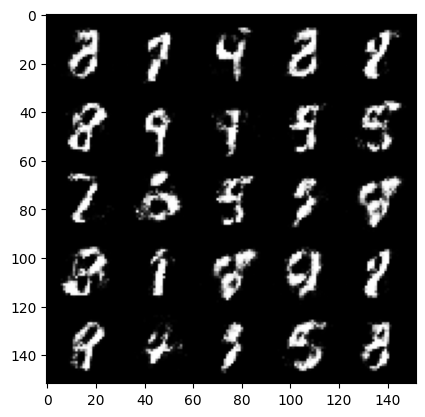

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 1.9042856206893912, discriminator loss: 0.3371824028491973


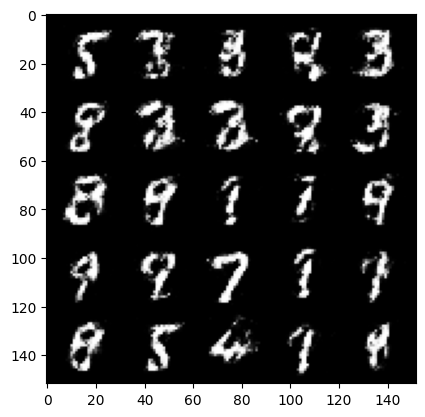

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 1.9081158740520465, discriminator loss: 0.33795382070541347


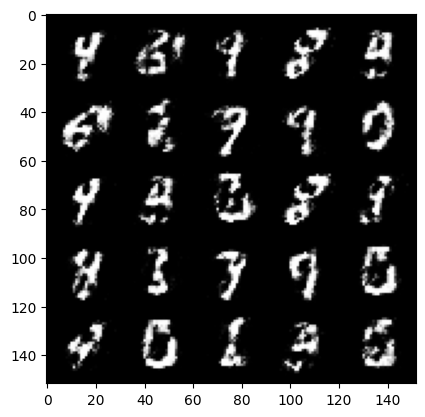

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 1.8728209440708155, discriminator loss: 0.345535897493362


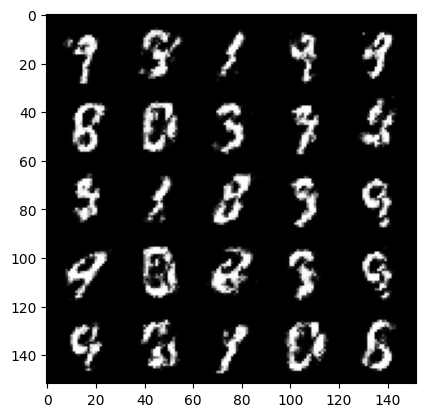

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 1.7809112563133243, discriminator loss: 0.3714933242201807


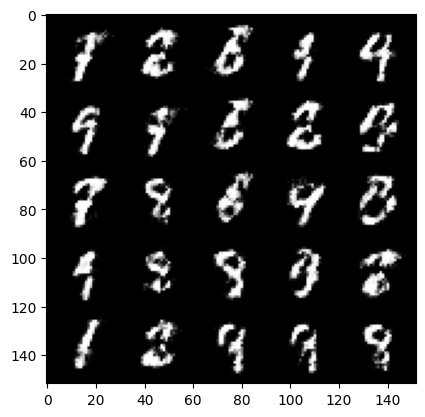

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 1.9368819022178652, discriminator loss: 0.31879065039753895


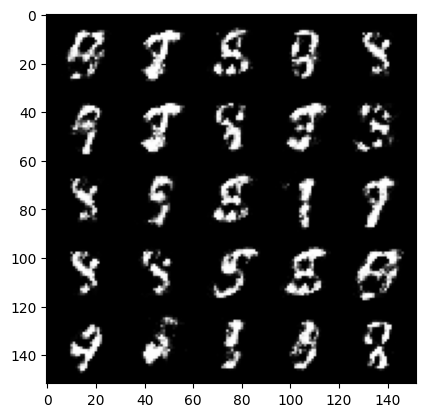

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 1.8833258585929864, discriminator loss: 0.3393000334203241


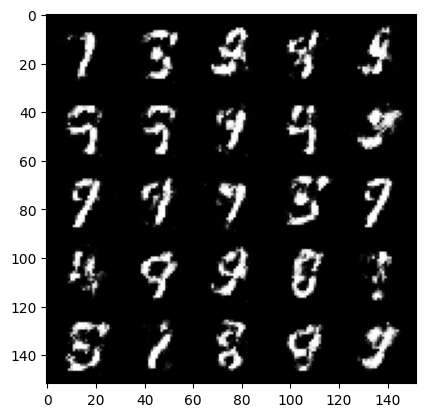

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 1.875283897399902, discriminator loss: 0.35272105661034575


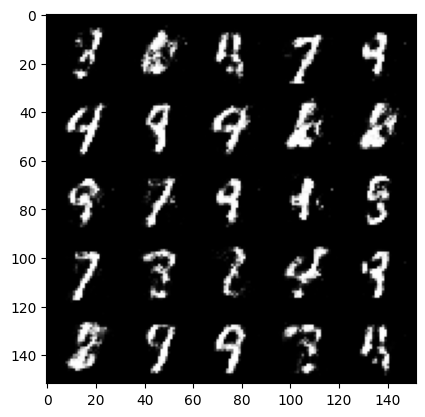

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator loss: 1.8043424940109265, discriminator loss: 0.36815649199485795


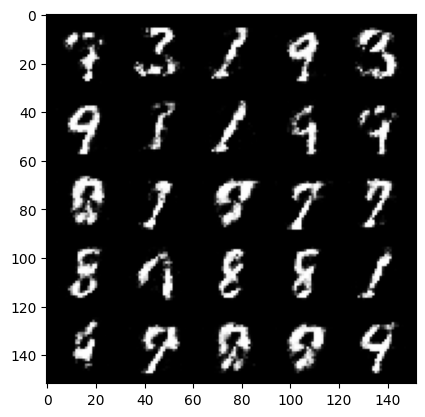

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 1.783127318143846, discriminator loss: 0.36448325109481833


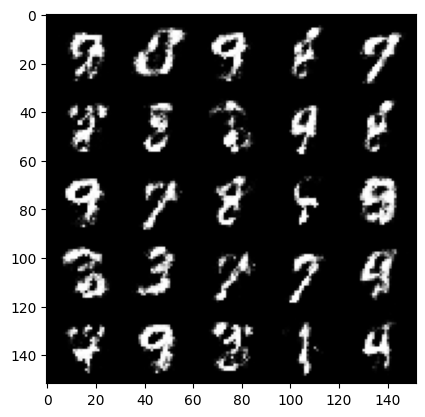

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500: Generator loss: 1.8515637042522424, discriminator loss: 0.34751785564422655


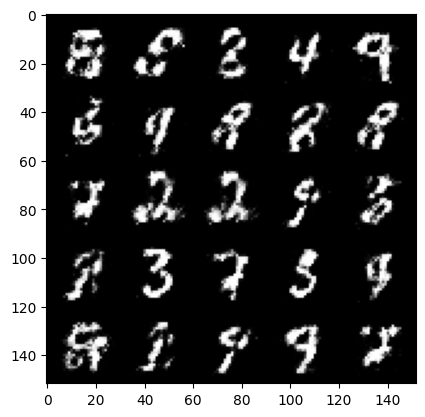

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 1.7878215830326083, discriminator loss: 0.38136275762319605


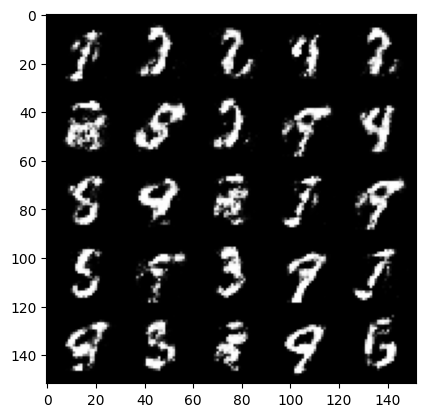

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500: Generator loss: 1.7602445709705348, discriminator loss: 0.3735007923841477


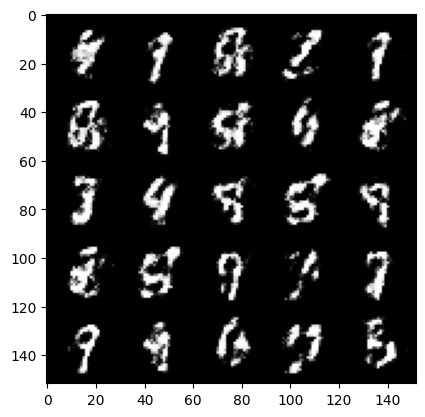

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 1.7345481626987447, discriminator loss: 0.38640449595451376


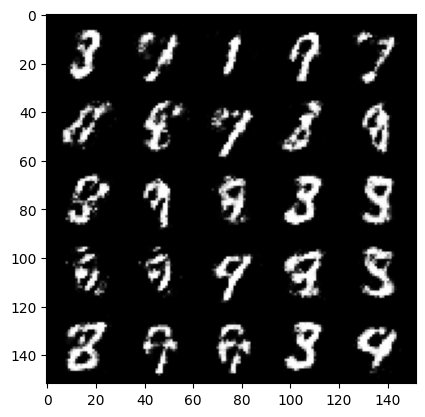

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500: Generator loss: 1.6944558656215674, discriminator loss: 0.3947079347968105


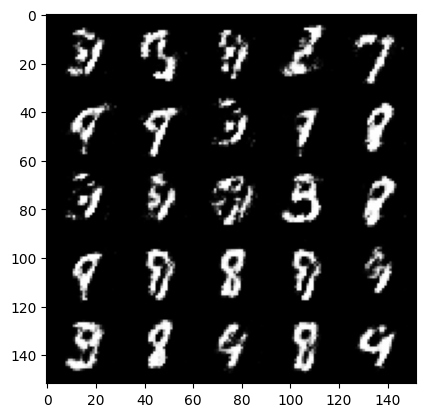

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 1.7837820851802826, discriminator loss: 0.3609733904004096


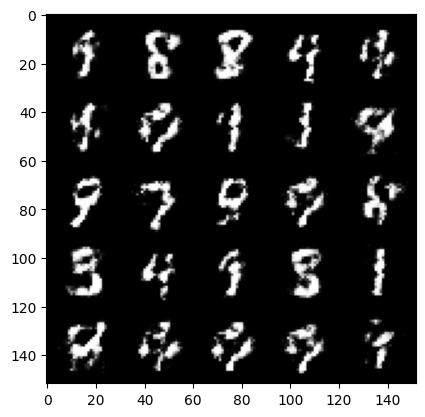

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500: Generator loss: 1.764692108631132, discriminator loss: 0.358715658724308


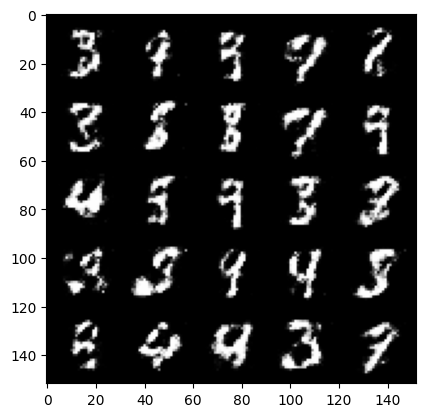

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 1.788950633287429, discriminator loss: 0.3677448943257332


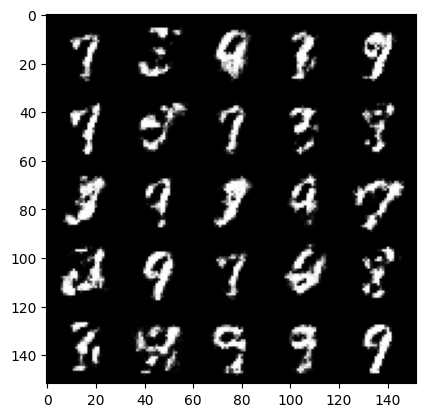

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500: Generator loss: 1.7125522391796097, discriminator loss: 0.3739192722439767


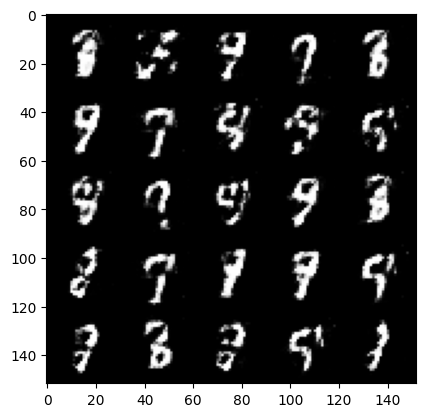

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 1.7185099198818212, discriminator loss: 0.3824181164503096


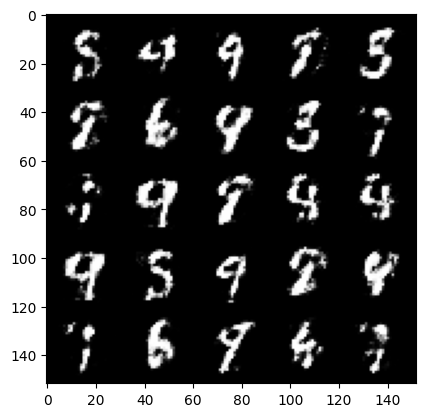

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500: Generator loss: 1.8230432305335986, discriminator loss: 0.34748847475647954


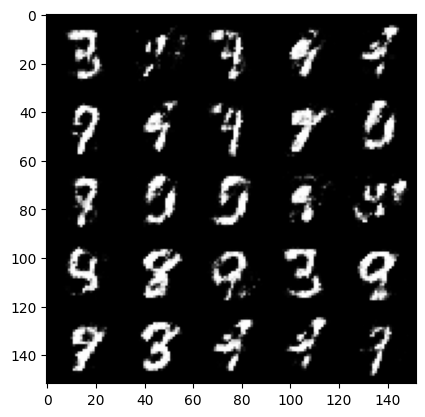

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 1.6808458628654477, discriminator loss: 0.38975592344999305


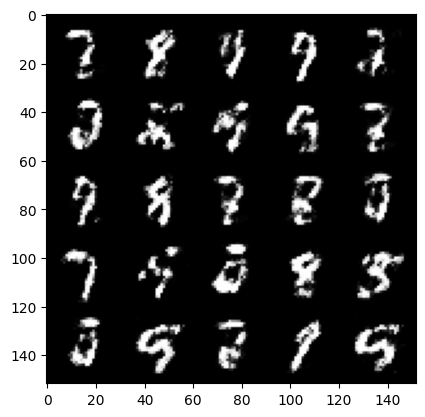

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500: Generator loss: 1.7746464214324944, discriminator loss: 0.3453897799849508


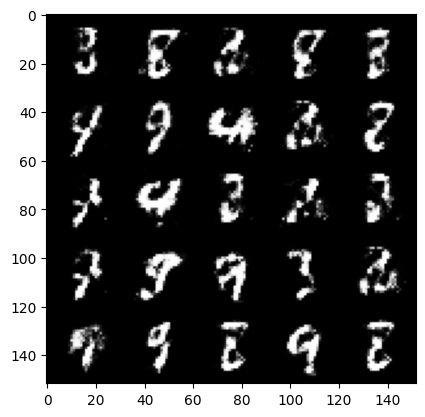

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 1.879362545013426, discriminator loss: 0.33446952500939375


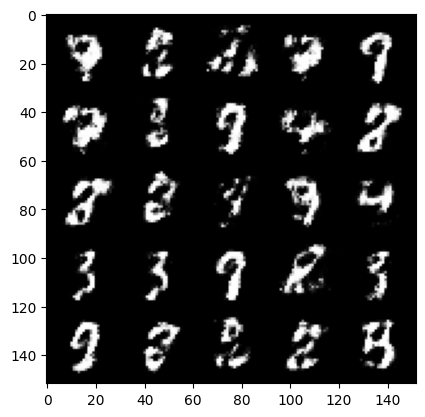

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500: Generator loss: 1.7624014399051666, discriminator loss: 0.36060311353206614


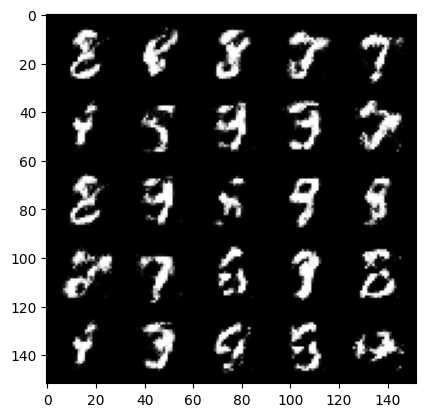

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 1.7885192377567294, discriminator loss: 0.3543035164773465


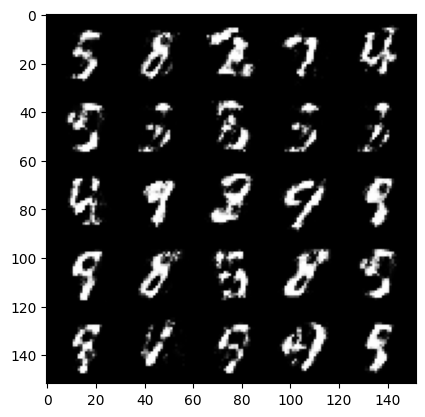

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500: Generator loss: 1.6858914115428907, discriminator loss: 0.37559277939796454


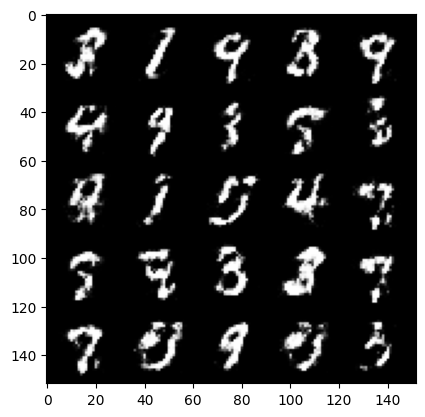

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 1.6282151901721946, discriminator loss: 0.3931711297035219


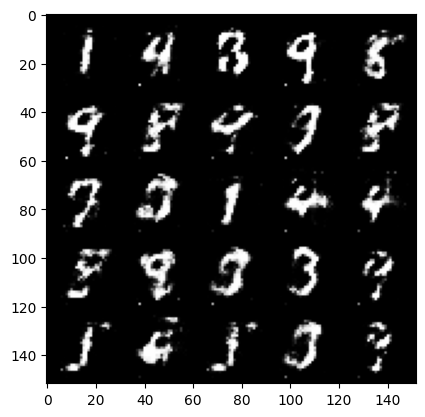

In [ ]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):

    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        disc_opt.zero_grad() # Zero out the gradients before backpropagation
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph = True)
        gen_opt.step()

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            #show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
